# Packages

In [1]:
import torch
import torch.nn as nn
from fastbook import *

matplotlib.rc('image', cmap='Greys')

# Why Pytorch

## 1. Tensors

In [2]:
data = [[1,2,3],[4,5,6]]
arr = array (data)
tns = tensor(data)

In [3]:
arr  # numpy

array([[1, 2, 3],
       [4, 5, 6]])

In [4]:
tns  # pytorch

tensor([[1, 2, 3],
        [4, 5, 6]])

In [5]:
tns[1]

tensor([4, 5, 6])

In [6]:
tns[:,1]

tensor([2, 5])

In [7]:
tns[1,1:3]

tensor([5, 6])

In [8]:
tns+1

tensor([[2, 3, 4],
        [5, 6, 7]])

In [9]:
tns.type()

'torch.LongTensor'

In [10]:
tns*1.5

tensor([[1.5000, 3.0000, 4.5000],
        [6.0000, 7.5000, 9.0000]])

## 2. Gradients

In [11]:
xt = tensor([3.,4.,10.]).requires_grad_()
xt

tensor([ 3.,  4., 10.], requires_grad=True)

In [12]:
def f(x): return (x**2).sum()

yt = f(xt)
yt

tensor(125., grad_fn=<SumBackward0>)

In [13]:
yt.backward()
xt.grad

tensor([ 6.,  8., 20.])

# SGD

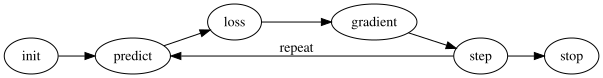

In [14]:
gv('''
init->predict->loss->gradient->step->stop
step->predict[label=repeat]
''')

In [15]:
time = torch.arange(0,20).float(); time

tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19.])

In [16]:
torch.randn(20)

tensor([ 1.9269,  1.4873,  0.9007, -2.1055, -0.7581,  1.0783,  0.8008,  1.6806,  0.3559, -0.6866, -0.4934,  0.2415, -0.2316,  0.0418, -0.2516,  0.8599, -0.3097, -0.3957,  0.8034, -0.6216])

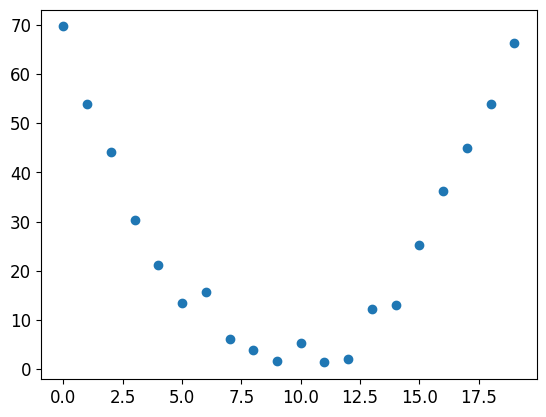

In [17]:
speed = torch.randn(20)*3 + 0.75*(time-9.5)**2 + 1
plt.scatter(time,speed);

In [22]:
def f(t, params):
    a, b, c = params
    return a * t**2 + b * t + c

## 1. Initialize

In [29]:
params = torch.randn(3).requires_grad_()

In [30]:
#hide
orig_params = params.clone()

## 2. Predict

In [31]:
preds = f(time, params)

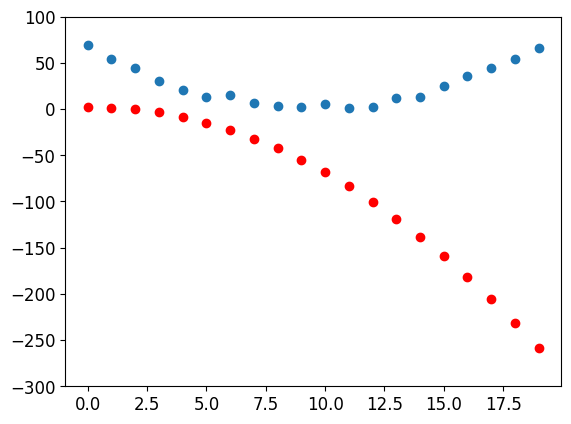

In [32]:
def show_preds(preds, ax=None):
    if ax is None: ax = plt.subplots()[1]
    ax.scatter(time, speed)
    ax.scatter(time, to_np(preds), color='red')
    ax.set_ylim(-300, 100)
show_preds(preds)

## 3. Loss

In [33]:
def mse(preds, targets): return ((preds-targets)**2).mean()

In [34]:
loss = mse(preds, speed)
loss

tensor(20769.5684, grad_fn=<MeanBackward0>)

## 4. Gradient

In [35]:
loss.backward()
params.grad

tensor([-47645.1094,  -3044.2251,   -224.3434])

## 5. Step

In [36]:
lr = 1e-5
params.data -= lr * params.grad.data
params.grad = None

In [37]:
preds = f(time,params)
mse(preds, speed)

tensor(4414.9824, grad_fn=<MeanBackward0>)

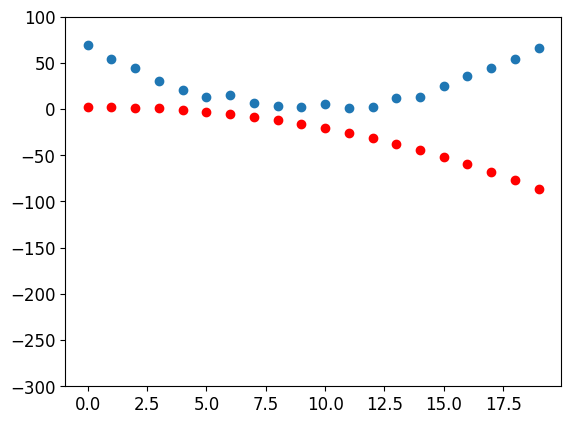

In [38]:
show_preds(preds)

In [39]:
def apply_step(params, ax=None):
    preds = f(time, params)
    loss = mse(preds, speed)
    loss.backward()
    params.data -= lr * params.grad.data
    params.grad = None
    
    if ax is None: 
        print(loss.item())
    else:
        show_preds(preds, ax)
    return preds, loss.item()

## 6. Repeat

In [40]:
for i in range(10): apply_step(params)

4414.982421875
1320.190673828125
734.5579833984375
623.7351684570312
602.7608642578125
598.78857421875
598.0335693359375
597.8873291015625
597.8564453125
597.8472900390625


In [41]:
#hide
params = orig_params.detach().requires_grad_()

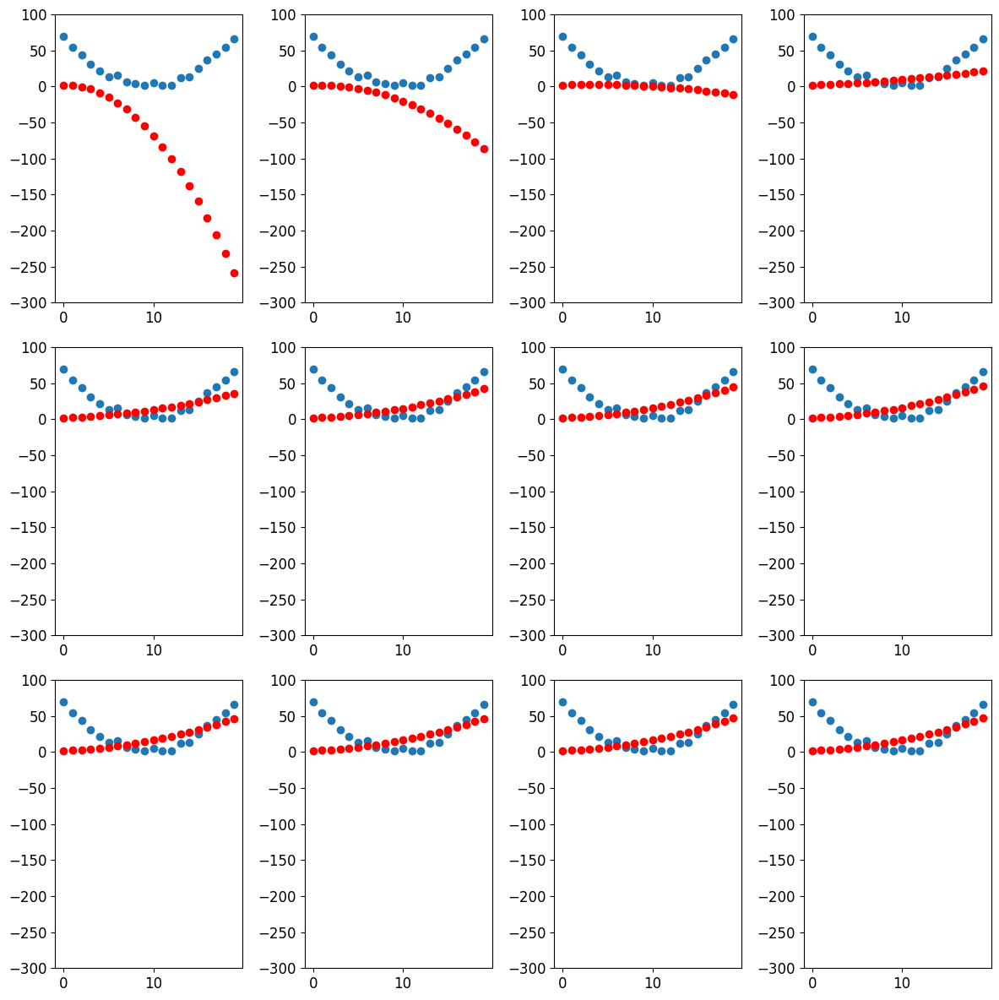

In [42]:
_, ax_list = plt.subplots(3,4,figsize=(12,12))
for axs in ax_list: 
    for ax in axs: 
        apply_step(params, ax)
plt.tight_layout()

## 7. Stop

597.8380737304688
597.8338623046875
597.8298950195312
597.8258056640625
597.8218383789062
597.8177490234375
597.813720703125
597.8096313476562
597.8055419921875
597.801513671875
597.7974243164062
597.7933959960938
597.789306640625
597.7852172851562
597.7811889648438
597.7772216796875
597.7730712890625
597.7691040039062
597.7650146484375
597.7609252929688
597.7567749023438
597.7528076171875
597.748779296875
597.7447509765625
597.7406616210938
597.7366943359375
597.7325439453125
597.7285766601562
597.7244262695312
597.7203369140625
597.71630859375
597.7123413085938
597.708251953125
597.7042236328125
597.7000732421875
597.6961059570312
597.6920166015625
597.68798828125
597.6840209960938
597.679931640625
597.6759033203125
597.6718139648438
597.6677856445312
597.6636352539062
597.6597290039062
597.6557006835938
597.651611328125
597.6475219726562
597.6435546875
597.6395263671875
597.635498046875
597.63134765625
597.6273803710938
597.6233520507812
597.6192626953125
597.6151733398438
597.61120

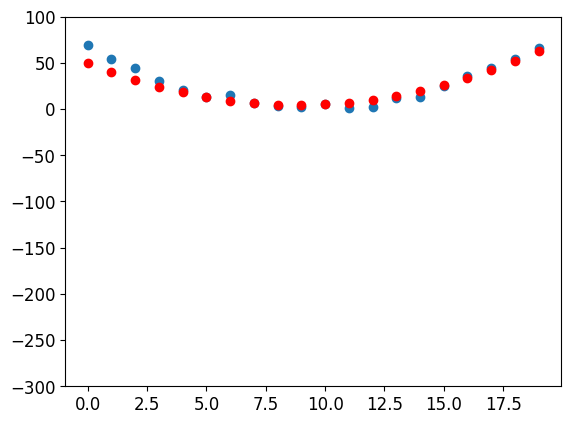

In [43]:
#hide
params = orig_params.detach().requires_grad_()
preds, loss = apply_step(params)
while loss >= 50:
    preds, loss = apply_step(params)
show_preds(preds)

# MNIST Sample Data

In [44]:
path = untar_data(URLs.MNIST_SAMPLE)
Path.BASE_PATH = path
path.ls()

(#3) [Path('valid'),Path('train'),Path('labels.csv')]

In [45]:
(path/'train').ls()

(#2) [Path('train/3'),Path('train/7')]

In [46]:
threes = (path/'train'/'3').ls().sorted()
sevens = (path/'train'/'7').ls().sorted()
threes

(#6131) [Path('train/3/10.png'),Path('train/3/10000.png'),Path('train/3/10011.png'),Path('train/3/10031.png'),Path('train/3/10034.png'),Path('train/3/10042.png'),Path('train/3/10052.png'),Path('train/3/1007.png'),Path('train/3/10074.png'),Path('train/3/10091.png')...]

In [47]:
im3_path = threes[1]
im3 = Image.open(im3_path)
im3

In [48]:
tensor(im3)[4:10,4:10]

tensor([[  0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,  29],
        [  0,   0,   0,  48, 166, 224],
        [  0,  93, 244, 249, 253, 187],
        [  0, 107, 253, 253, 230,  48],
        [  0,   3,  20,  20,  15,   0]], dtype=torch.uint8)

In [49]:
im3_t = tensor(im3)
df = pd.DataFrame(im3_t[4:15,4:22])
df.style.set_properties(**{'font-size':'6pt'}).background_gradient('Greys')

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,29,150,195,254,255,254,176,193,150,96,0,0,0
2,0,0,0,48,166,224,253,253,234,196,253,253,253,253,233,0,0,0
3,0,93,244,249,253,187,46,10,8,4,10,194,253,253,233,0,0,0
4,0,107,253,253,230,48,0,0,0,0,0,192,253,253,156,0,0,0
5,0,3,20,20,15,0,0,0,0,0,43,224,253,245,74,0,0,0
6,0,0,0,0,0,0,0,0,0,0,249,253,245,126,0,0,0,0
7,0,0,0,0,0,0,0,14,101,223,253,248,124,0,0,0,0,0
8,0,0,0,0,0,11,166,239,253,253,253,187,30,0,0,0,0,0
9,0,0,0,0,0,16,248,250,253,253,253,253,232,213,111,2,0,0


# Pixel Similarity (Tensor Operations)

In [50]:
three_tensors = [tensor(Image.open(o)) for o in threes]
seven_tensors = [tensor(Image.open(o)) for o in sevens]

In [51]:
len(three_tensors),len(seven_tensors)

(6131, 6265)

<AxesSubplot: >

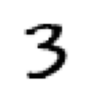

In [52]:
show_image(three_tensors[1])

In [53]:
stacked_threes = torch.stack(three_tensors).float()/255
stacked_sevens = torch.stack(seven_tensors).float()/255

In [54]:
stacked_threes.shape

torch.Size([6131, 28, 28])

In [55]:
len(stacked_threes.shape)
stacked_threes.ndim

3

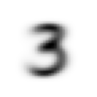

In [56]:
mean3 = stacked_threes.mean(0)
show_image(mean3);

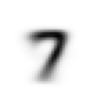

In [57]:
mean7 = stacked_sevens.mean(0)
show_image(mean7);

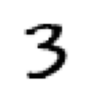

In [58]:
a_3 = stacked_threes[1]
show_image(a_3);

In [59]:
dist_3_abs = (a_3 - mean3).abs().mean()
dist_3_sqr = ((a_3 - mean3) ** 2).mean().sqrt()
dist_3_abs,dist_3_sqr

(tensor(0.1114), tensor(0.2021))

In [60]:
dist_7_abs = (a_3 - mean7).abs().mean()
dist_7_sqr = ((a_3 - mean7)**2).mean().sqrt()
dist_7_abs,dist_7_sqr

(tensor(0.1586), tensor(0.3021))

In [61]:
valid_3_tens = torch.stack([tensor(Image.open(o)) 
                            for o in (path/'valid'/'3').ls()])
valid_3_tens = valid_3_tens.float()/255
valid_7_tens = torch.stack([tensor(Image.open(o)) 
                            for o in (path/'valid'/'7').ls()])
valid_7_tens = valid_7_tens.float()/255
valid_3_tens.shape,valid_7_tens.shape

(torch.Size([1010, 28, 28]), torch.Size([1028, 28, 28]))

In [62]:
def mnist_distance(a, b): return (a - b).abs().mean((-1, -2))
mnist_distance(a_3, mean3)

tensor(0.1114)

In [63]:
valid_3_dist = mnist_distance(valid_3_tens, mean3)
valid_3_dist, valid_3_dist.shape

(tensor([0.1316, 0.1198, 0.1163,  ..., 0.1080, 0.1100, 0.1203]),
 torch.Size([1010]))

In [68]:
def is_3(x): return mnist_distance(x,mean3) < mnist_distance(x,mean7)

In [69]:
is_3(a_3), is_3(a_3).float()

(tensor(True), tensor(1.))

In [70]:
is_3(valid_3_tens)

tensor([ True, False,  True,  ...,  True,  True,  True])

In [71]:
accuracy_3s = is_3(valid_3_tens).float().mean()
accuracy_7s = (~is_3(valid_7_tens)).float().mean()
accuracy_3s,accuracy_7s,(accuracy_3s+accuracy_7s)/2

(tensor(0.9168), tensor(0.9854), tensor(0.9511))

# The MNIST NN

## Datasets

In [ ]:
train_x = torch.cat([stacked_threes, stacked_sevens]).view(-1, 28*28) 

In [ ]:
train_y = tensor([1]*len(threes) + [0]*len(sevens)).unsqueeze(1)
train_x.shape,train_y.shape

In [ ]:
dset = list(zip(train_x,train_y))
x,y = dset[0]
x.shape,y

In [ ]:
valid_x = torch.cat([valid_3_tens, valid_7_tens]).view(-1, 28*28)
valid_y = tensor([1]*len(valid_3_tens) + [0]*len(valid_7_tens)).unsqueeze(1)
valid_dset = list(zip(valid_x,valid_y))

## 1. Init

In [ ]:
def init_params(size, std=1.0): return (torch.randn(size)*std).requires_grad_()

In [ ]:
weights = init_params((28*28, 1))

In [ ]:
bias = init_params(1)

## 2. Predict (with just a linear function)

In [ ]:
(train_x[0]*weights.T).sum() + bias

In [ ]:
def linear1(xb): return xb@weights + bias
preds = linear1(train_x)
preds

## 3. Loss

### 3.1 Bad Loss

In [ ]:
corrects = (preds > 0.0).float() == train_y
corrects

In [ ]:
corrects.float().mean().item()

In [ ]:
with torch.no_grad(): weights[0] *= 1.0001

In [ ]:
preds = linear1(train_x)
((preds>0.0).float() == train_y).float().mean().item()

### 3.2.1 Good Loss

In [ ]:
trgts  = tensor([1,0,1])
prds   = tensor([0.9, 0.4, 0.2])

In [ ]:
def mnist_loss(predictions, targets):
    return torch.where(targets==1, 1-predictions, predictions).mean()

In [ ]:
mnist_loss(prds,trgts)

In [ ]:
torch.where(trgts==1, 1-prds, prds)

In [ ]:
mnist_loss(tensor([0.9, 0.4, 0.8]), trgts)

### 3.2.2 Sigmoid

In [ ]:
def sigmoid(x): return 1/(1+torch.exp(-x))

In [ ]:
plot_function(torch.sigmoid, title='Sigmoid', min=-4, max=4)

In [ ]:
def mnist_loss(predictions, targets):
    predictions = predictions.sigmoid()
    return torch.where(targets==1, 1-predictions, predictions).mean()

## Putting It All Together with DataLoaders

Draft:

```python
for x,y in dl:
    pred = model(x)
    loss = loss_func(pred, y)
    loss.backward()
    parameters -= parameters.grad * lr
```

In [ ]:
weights = init_params((28*28,1))
bias = init_params(1)

In [ ]:
dl = DataLoader(dset, batch_size=256)
xb,yb = first(dl)
xb.shape,yb.shape

In [ ]:
valid_dl = DataLoader(valid_dset, batch_size=256)

In [ ]:
batch = train_x[:4]
batch.shape

In [ ]:
preds = linear1(batch)
preds

In [ ]:
loss = mnist_loss(preds, train_y[:4])
loss

In [ ]:
loss.backward()
weights.grad.shape, weights.grad.mean(), bias.grad

In [ ]:
def calc_grad(xb, yb, model):
    preds = model(xb)
    loss = mnist_loss(preds, yb)
    loss.backward()

In [ ]:
calc_grad(batch, train_y[:4], linear1)
weights.grad.mean(),bias.grad

In [ ]:
def train_epoch(model, lr, params):
    for xb, yb in dl:
        calc_grad(xb, yb, model)
        for p in params:
            p.data -= p.grad*lr
            p.grad.zero_()

In [ ]:
(preds>0.0).float() == train_y[:4]

In [ ]:
def batch_accuracy(preds, trgts):
    corrects = (preds>0.0).float() == trgts
    return corrects.float().mean()

In [ ]:
batch_accuracy(linear1(batch), train_y[:4])

In [ ]:
def validate_epoch(model):
    accs = [batch_accuracy(model(xb), yb) for xb, yb in valid_dl]
    return round(torch.stack(accs).mean().item(), 4)

In [ ]:
validate_epoch(linear1)

In [ ]:
lr = 1.
params = weights,bias
train_epoch(linear1, lr, params)
validate_epoch(linear1)

In [ ]:
for i in range(20):
    train_epoch(linear1, lr, params)
    print(validate_epoch(linear1), end=' ')

## More Pytorch (Optimizers, nn.Modules)

In [ ]:
linear_model = nn.Linear(28*28,1)

In [ ]:
w,b = linear_model.parameters()
w.shape,b.shape

In [ ]:
class BasicOptim:
    def __init__(self, params, lr) -> None:
        self.params, self.lr = list(params), lr

    def step(self, *args, **kwargs):
        for p in self.params:
            p.data -= p.grad.data * self.lr
    
    def zero_grad(self, *args, **kwargs):
        for p in self.params: p.grad.zero_()

In [ ]:
opt = BasicOptim(linear_model.parameters(), lr)

In [ ]:
def train_epoch(model):
    for xb, yb in dl:
        calc_grad(xb, yb, model)
        opt.step()
        opt.zero_grad()

In [ ]:
validate_epoch(linear_model)

In [ ]:
def train_model(model, epochs):
    for i in range(epochs):
        train_epoch(linear_model)
        print(validate_epoch(model), end=' ')

In [ ]:
train_model(linear_model, 20)

In [ ]:
linear_model = nn.Linear(28*28,1)
opt = SGD(linear_model.parameters(), lr)
train_model(linear_model, 20)

In [ ]:
dls = DataLoaders(dl, valid_dl)

In [ ]:
learn = Learner(dls, nn.Linear(28*28, 1), opt_func=SGD, loss_func=mnist_loss, metrics=batch_accuracy)

In [ ]:
learn.fit(10, lr=lr)

## Adding a Nonlinearity

In [ ]:
def simple_net(xb):
    res = xb@w1 + b1
    res = res.max(tensor(0.0))
    res = res@w2 + b2
    return res

In [ ]:
w1 = init_params((28*28,30))
b1 = init_params(30)
w2 = init_params((30,1))
b2 = init_params(1)

In [ ]:
simple_net = nn.Sequential(
    nn.Linear(28*28, 30),
    nn.ReLU(), 
    nn.Linear(30, 1)
)

In [ ]:
learn = Learner(dls, simple_net, opt_func=SGD,
                loss_func=mnist_loss, metrics=batch_accuracy)

In [ ]:
#hide_output
learn.fit(40, 0.1)

In [ ]:
plt.plot(L(learn.recorder.values).itemgot(2));

In [ ]:
learn.recorder.values[-1][2]